In [59]:
#Impoting Libraries
import pandas as pd
import matplotlib.pyplot as plt
import openpyxl
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import spacy
from wordcloud import WordCloud
from textblob import TextBlob
import networkx as nx
from collections import Counter
from itertools import combinations


# Download necessary NLTK data files
nltk.download('punkt')
nltk.download('stopwords')

# Load the spaCy English model
nlp = spacy.load('en_core_web_sm')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\roshn\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\roshn\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Functions for Wordcloud

In [32]:
# Preprocessing
def preprocess_text(text, stopword='Yes'):
    """
    Preprocess the input text by applying the following steps:
    1. Convert to lowercase.
    2. Remove punctuation and special characters.
    3. Tokenize the text.
    4. Remove stopwords.
    5. Perform lemmatization using spaCy.
    6. Optionally, stem words (commented out by default).
    
    Args:
        text (str): The input text to preprocess.
    
    Returns:
        str: Preprocessed text as a single string of words.
    """
    # Convert to string and handle NaN
    if not isinstance(text, str):
        text = str(text) if text is not None else ""
    
    # Lowercase the text
    text = text.lower()
    
    # Remove punctuation and special characters using regular expressions
    text = re.sub(r'[^\w\s]', '', text)
    
    # Tokenize the text using NLTK
    tokens = word_tokenize(text)
    
    # Remove stopwords using NLTK
    if stopword=='Yes':
        stop_words = set(stopwords.words('english'))
        tokens = [word for word in tokens if word not in stop_words]
    
    # Lemmatization using spaCy
    doc = nlp(" ".join(tokens))  # Rejoin tokens before processing with spaCy
    lemmatized_tokens = [token.lemma_ for token in doc]
    
    # Return the preprocessed text as a space-separated string of words
    return " ".join(lemmatized_tokens)

In [33]:
def create_wordcloud(preprocessed_data):
    """
    Creating the wordcloud for the given dataset:
    1. Merge all the preprocessed sentences into a single string
    2. Call for the wordcloud function
    Args:
        df : P.
    
    Returns:
        wrodcloud: Image of the wordcloud.
    """
    # Extract text from the 'sentence' column
    text_data = " ".join(preprocessed_data)
    # Create a word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Word Cloud for 'sentence' Column", fontsize=16)
    plt.show()


### Reading Dataset

##### With Stopwords

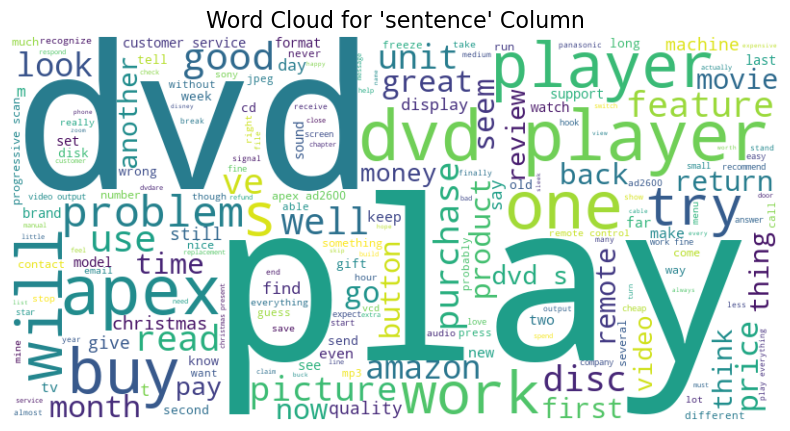

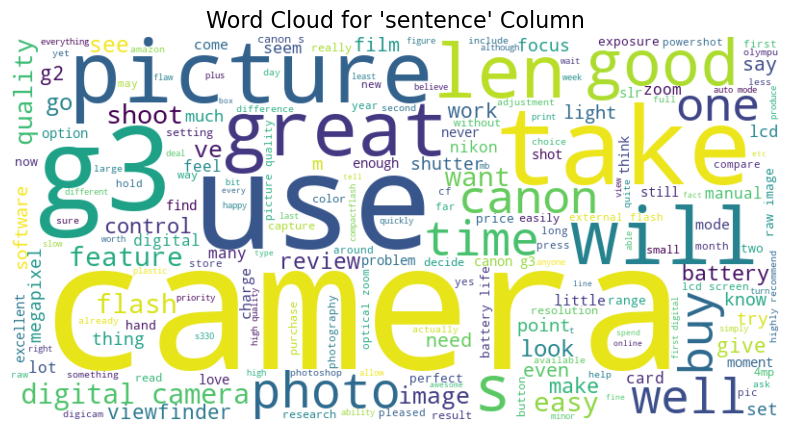

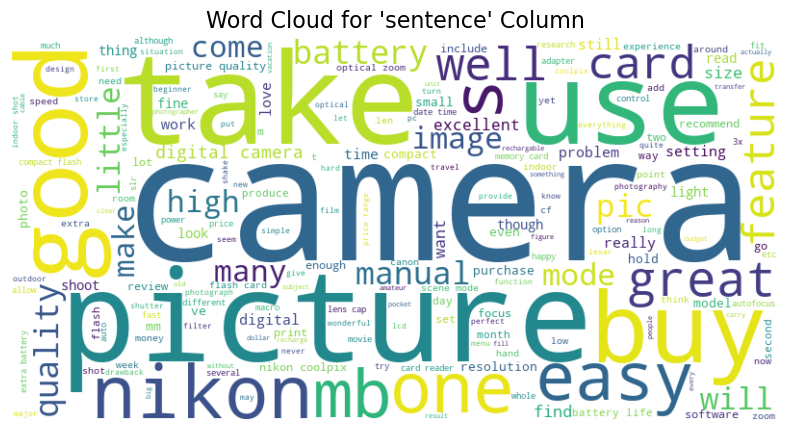

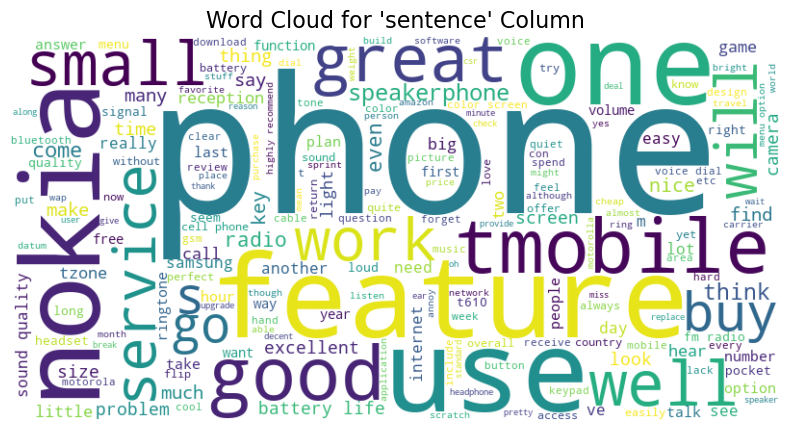

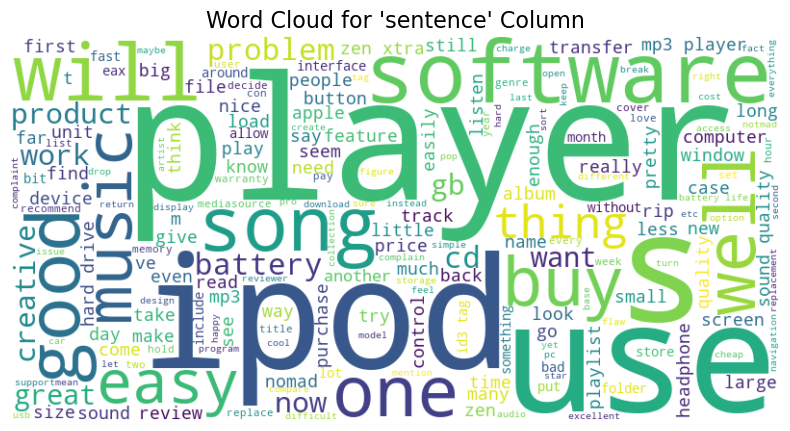

In [44]:
# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    preprocessed_data = [preprocess_text(text, 'No') for text in data['sentence']]
    create_wordcloud(preprocessed_data)


##### Without Stopwords

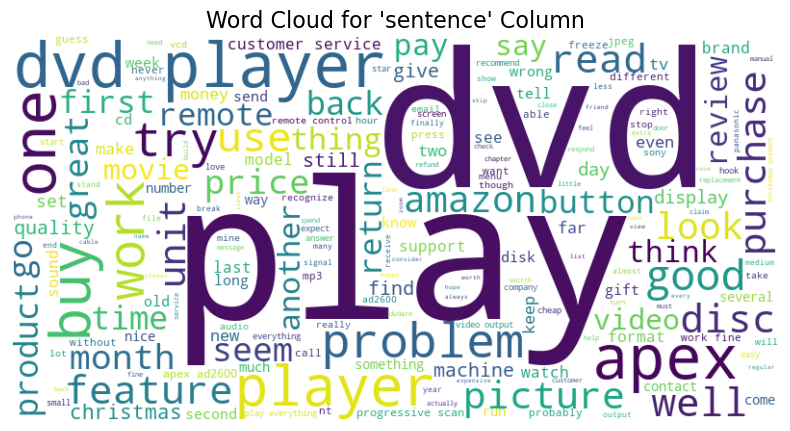

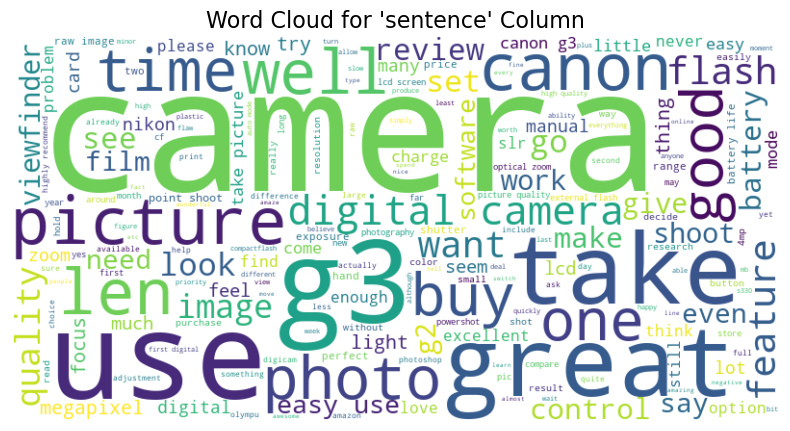

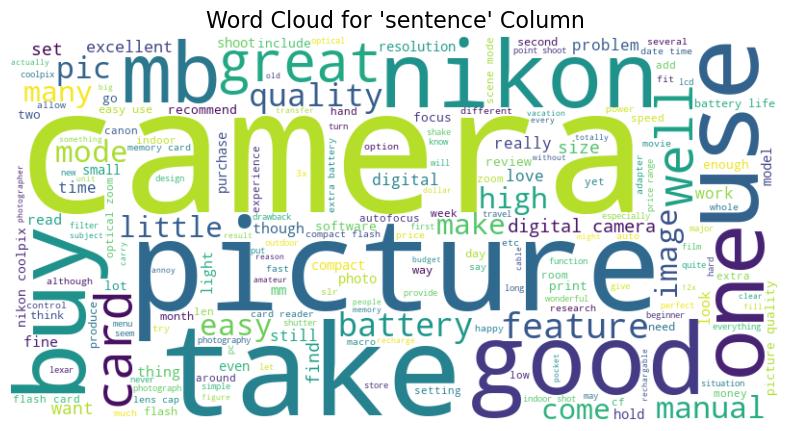

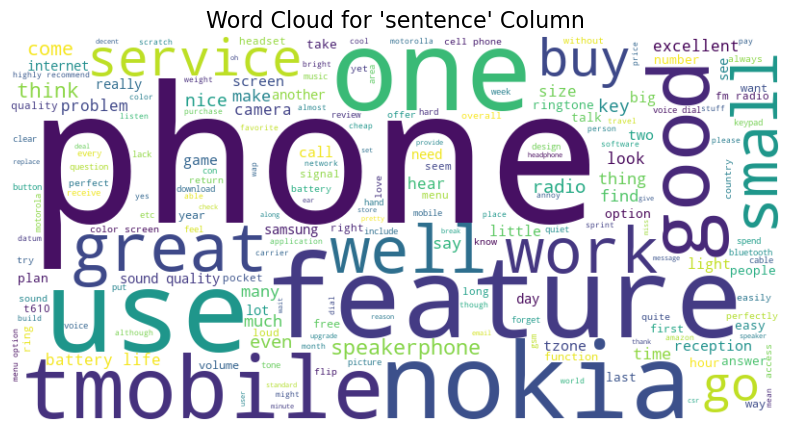

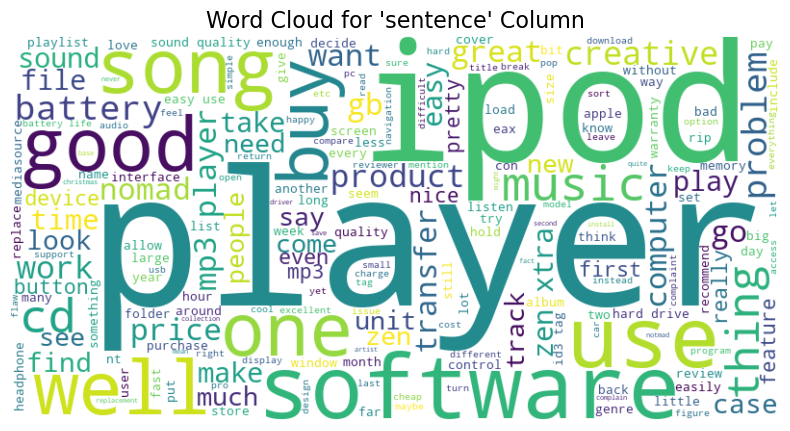

In [34]:
# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    preprocessed_data = [preprocess_text(text) for text in data['sentence']]
    create_wordcloud(preprocessed_data)


##### Wordcount of Title

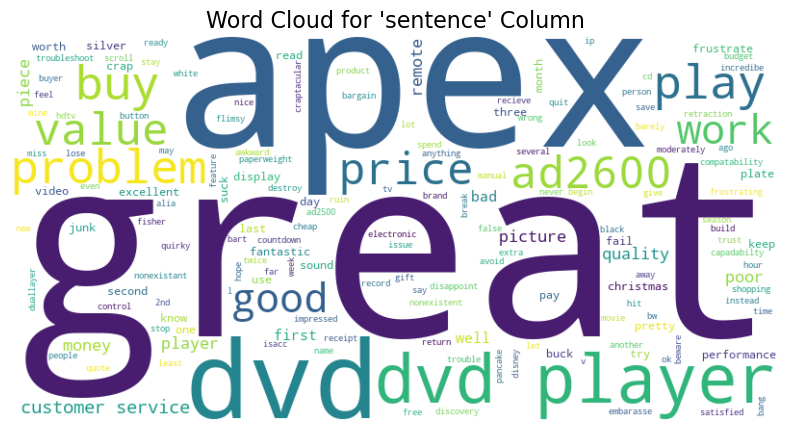

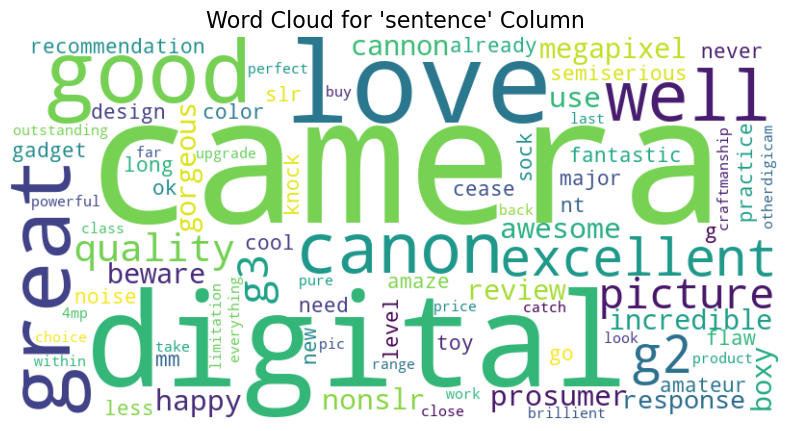

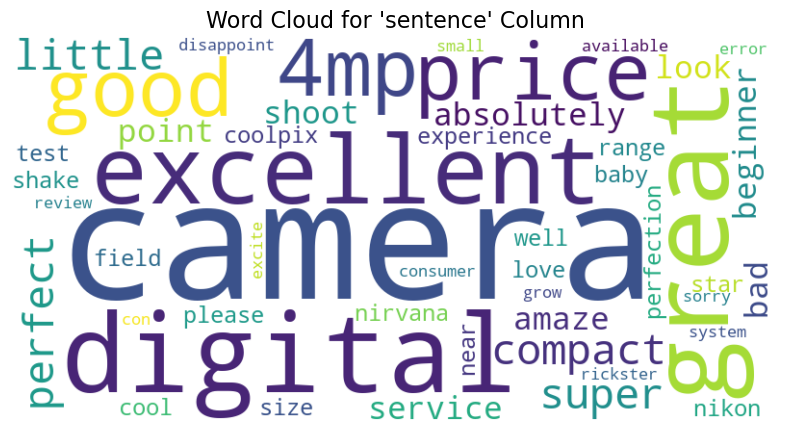

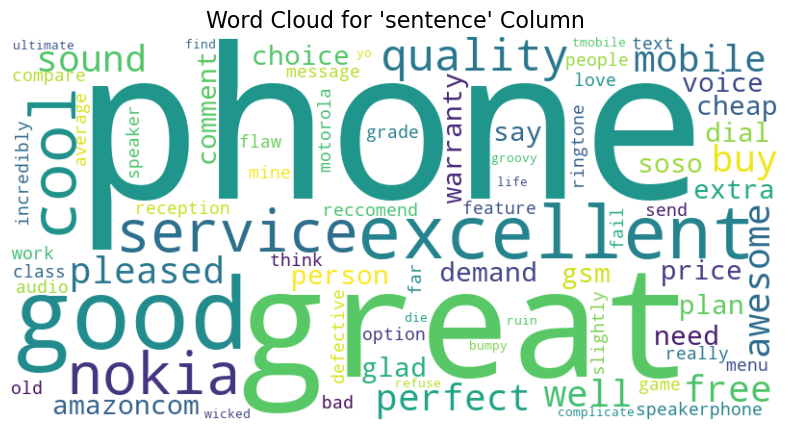

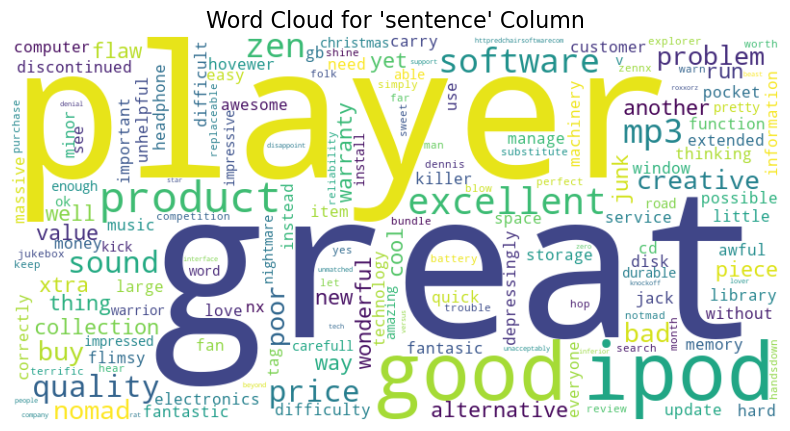

In [43]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data.groupby('title')['title'].count().reset_index(name='Count').rename(columns={'title': 'Title'})
    preprocessed_data = [preprocess_text(text) for text in data['Title']]
    create_wordcloud(preprocessed_data)

##### High Positive word count

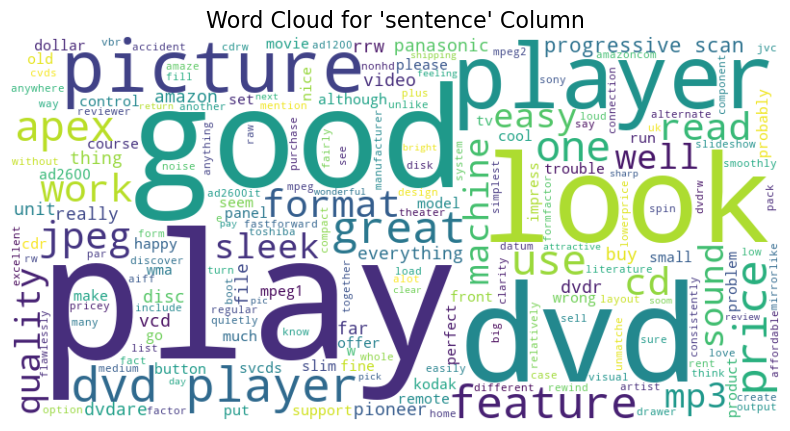

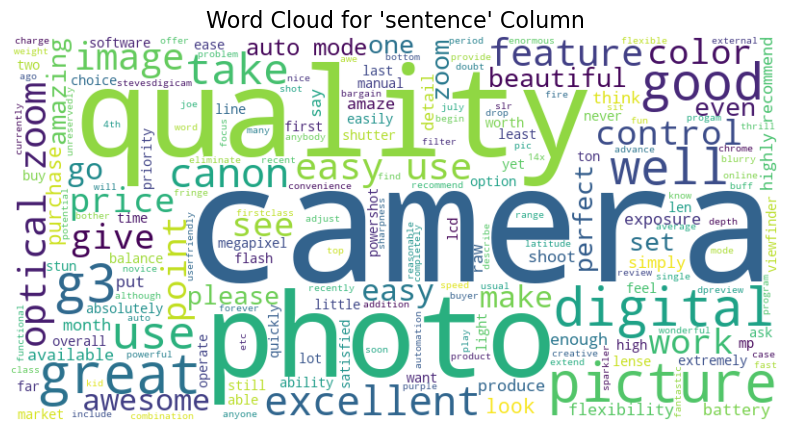

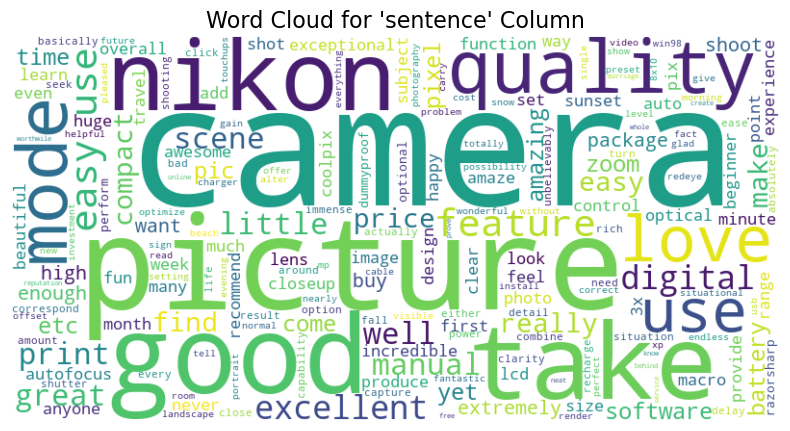

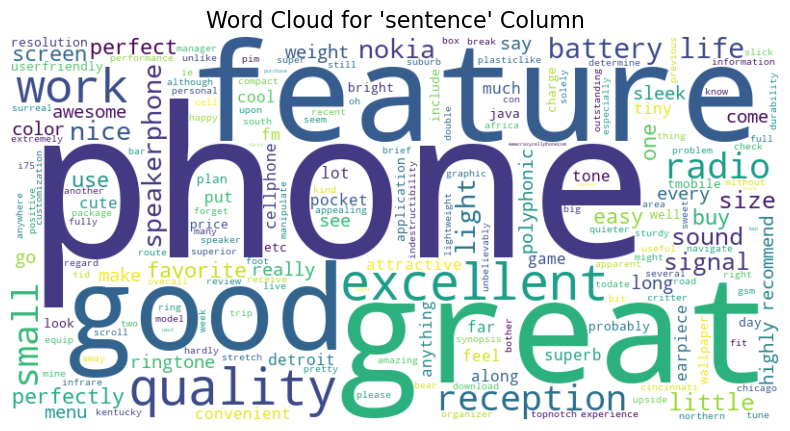

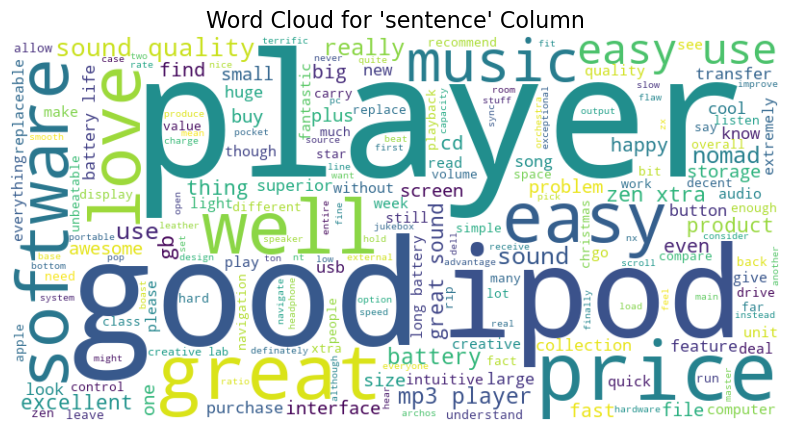

In [67]:
# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']>=3]
    preprocessed_data = [preprocess_text(text) for text in data['sentence']]
    create_wordcloud(preprocessed_data)


##### Negative Word count

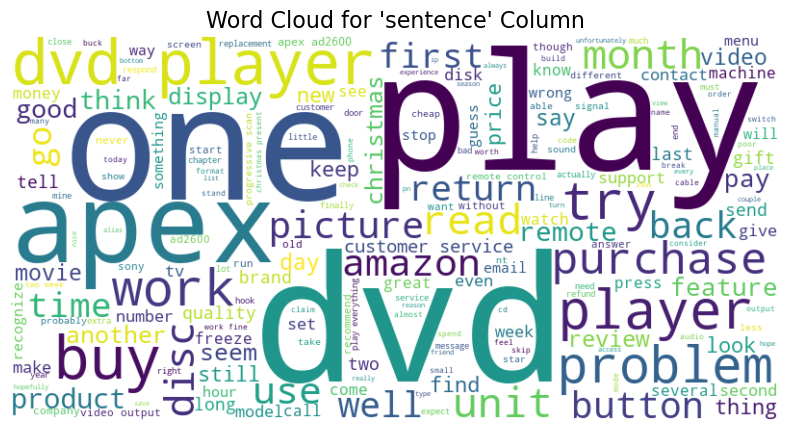

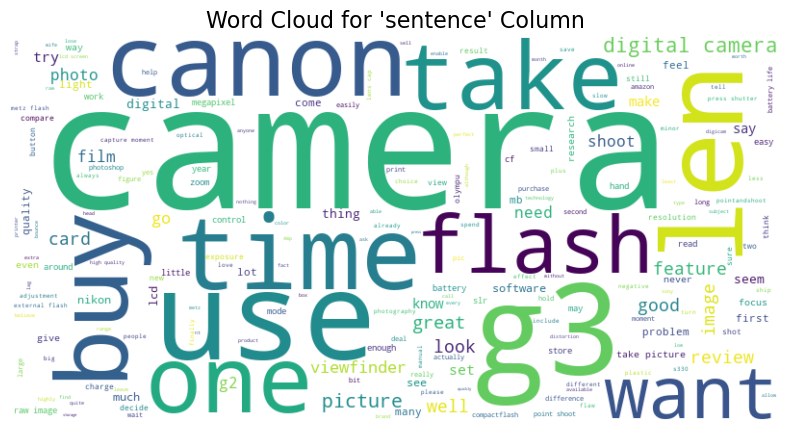

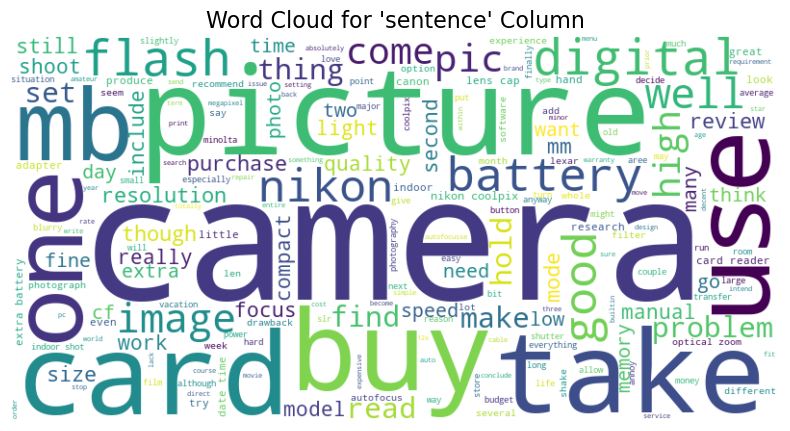

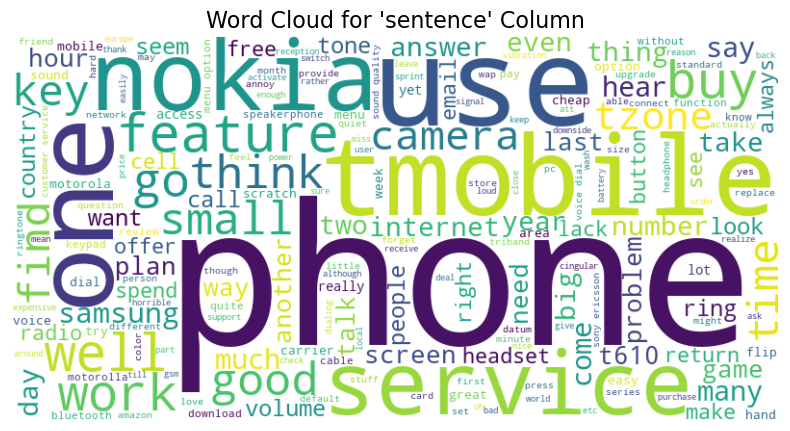

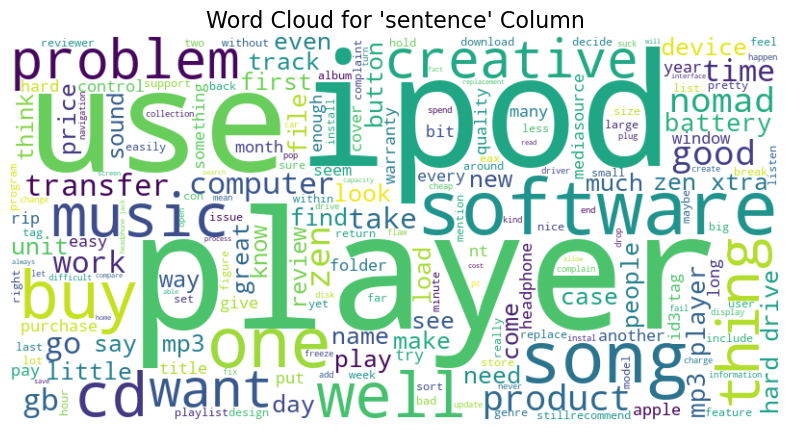

In [68]:
# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']<=0]
    preprocessed_data = [preprocess_text(text) for text in data['sentence']]
    create_wordcloud(preprocessed_data)


### Positive and Negative Sentiment Distribution

In [61]:
def titlewise_Analysis(df):
    df_group = (
        df.groupby('title')
        .agg(
            positive_count=('sentiment_total', lambda x: (x > 0).sum()),
            negative_count=('sentiment_total', lambda x: (x < 0).sum()),
            total_count=('sentiment_total', 'count'),
            mean=('sentiment_total', 'mean'),
            Overall_sentiment=('sentiment_total', 'sum'),
        )
        .reset_index()
    )
    df_group.loc[df_group['Overall_sentiment'] > 0, 'Sentiment'] = 'Positive'
    df_group.loc[df_group['Overall_sentiment'] <= 0, 'Sentiment'] = 'Negative'
    return df_group

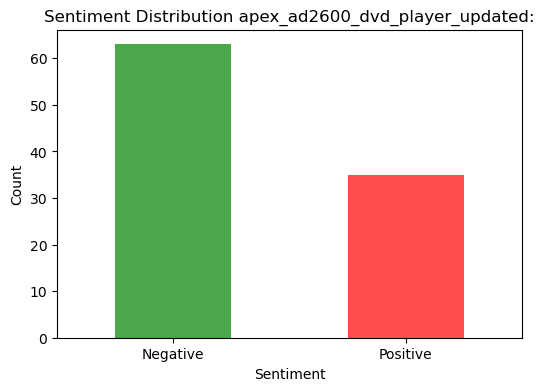

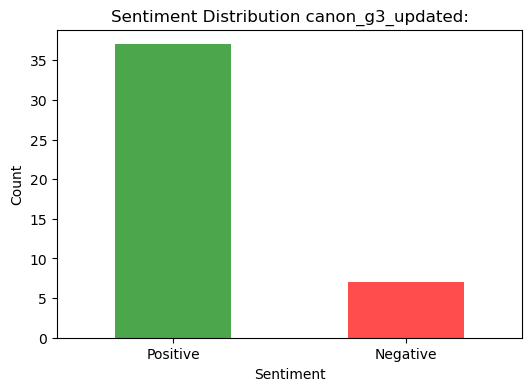

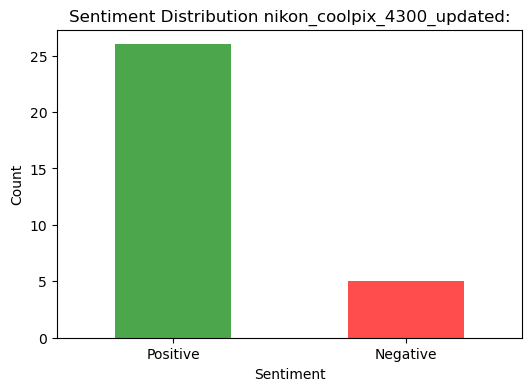

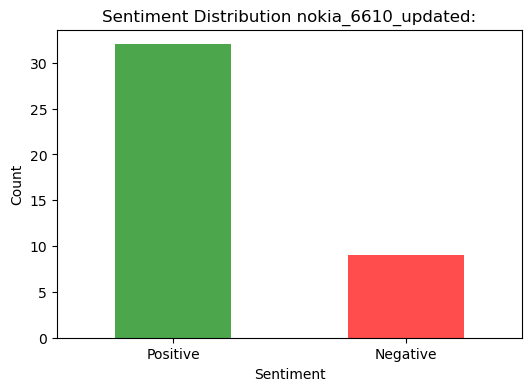

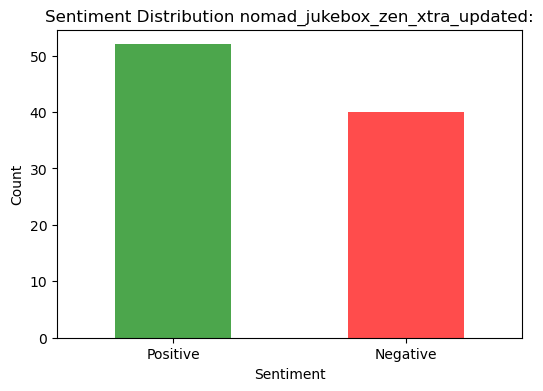

In [63]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
with pd.ExcelWriter('Positive_Negative_Distribution.xlsx') as writer:
    for product in prod_Lis:
        file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
        data = pd.read_csv(file_path)
        data_group= titlewise_Analysis(data)
        # Save the resulting group to a new sheet in the Excel file
        data_group.to_excel(writer, sheet_name=product, index=False)
        # Count the occurrences of Positive and Negative sentiments
        sentiment_counts = data_group['Sentiment'].value_counts()
        
        # Plotting the bar chart
        plt.figure(figsize=(6, 4))
        sentiment_counts.plot(kind='bar', color=['green', 'red'], alpha=0.7)
        plt.title(f'Sentiment Distribution {product}:')
        plt.xlabel('Sentiment')
        plt.ylabel('Count')
        plt.xticks(rotation=0)  # To keep x-axis labels horizontal
        plt.show()

### Distribution of text length

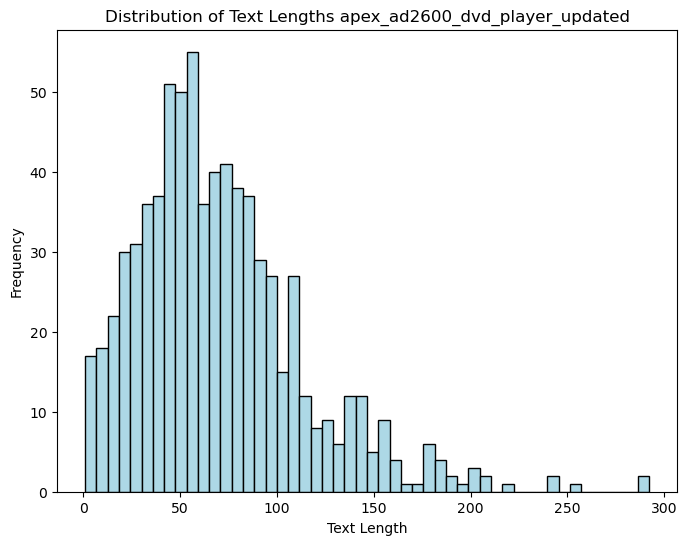

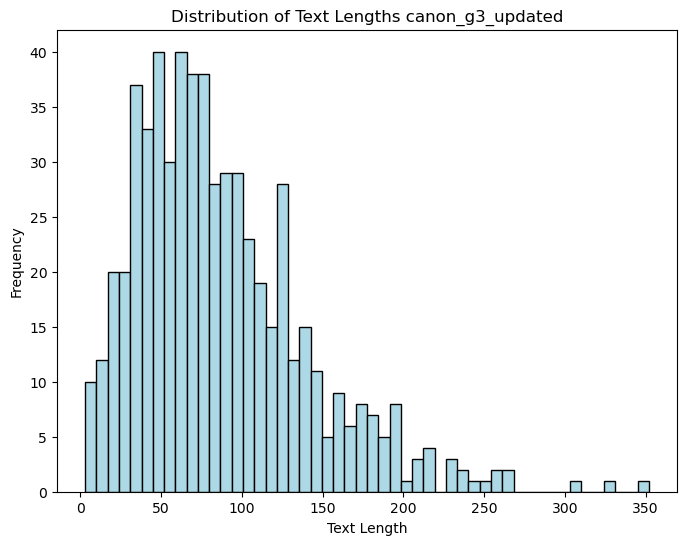

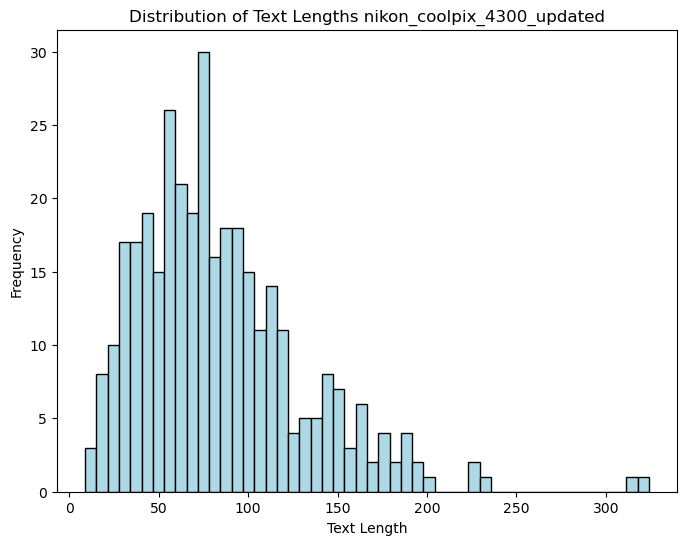

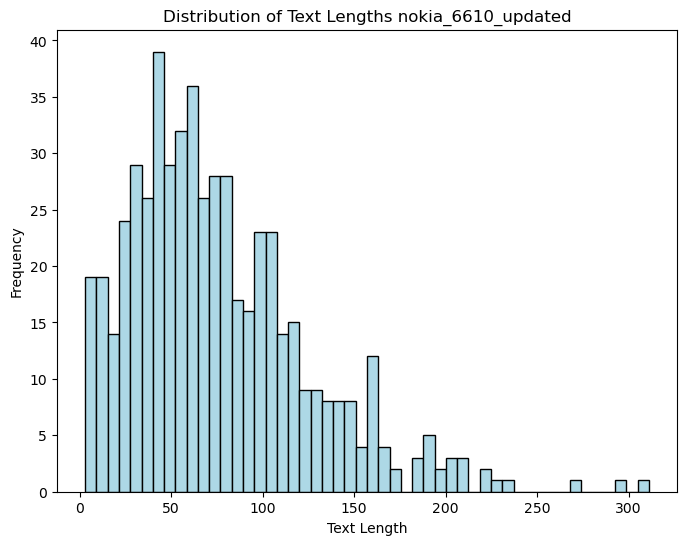

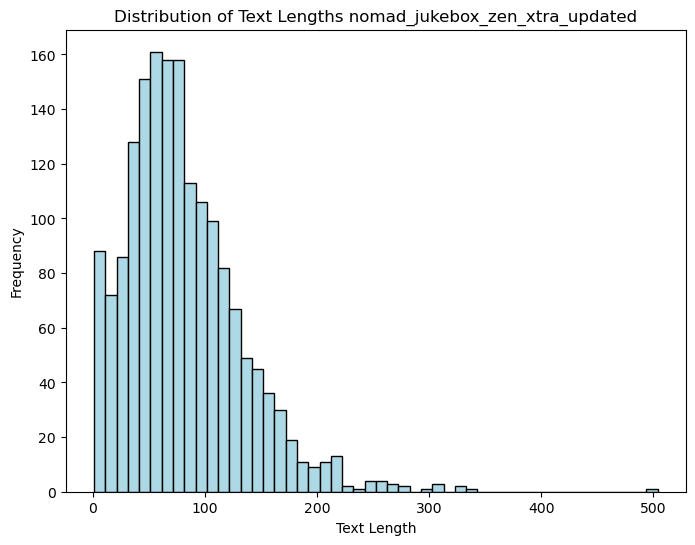

In [65]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    # Add a column for text length
    data['text_length'] = data['sentence'].apply(lambda x: len(str(x)))

    # Plot distribution of text lengths
    plt.figure(figsize=(8, 6))
    plt.hist(data['text_length'], bins=50, color='lightblue', edgecolor='black')
    plt.title(f'Distribution of Text Lengths {product}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.show()


##### High Positive Word Distribution

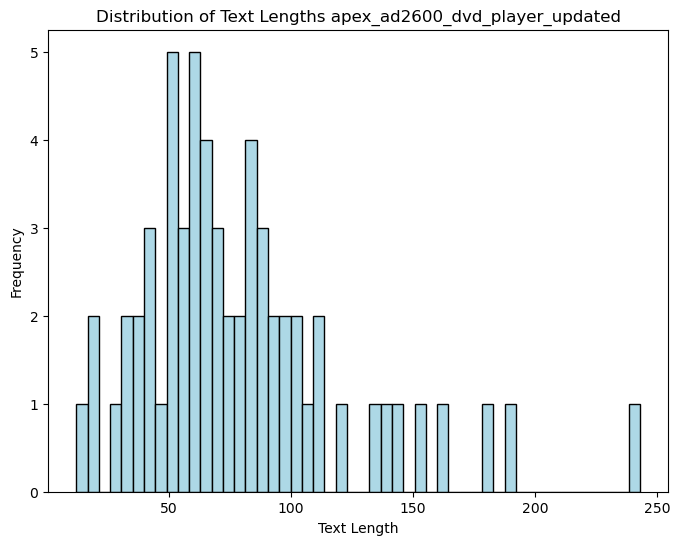

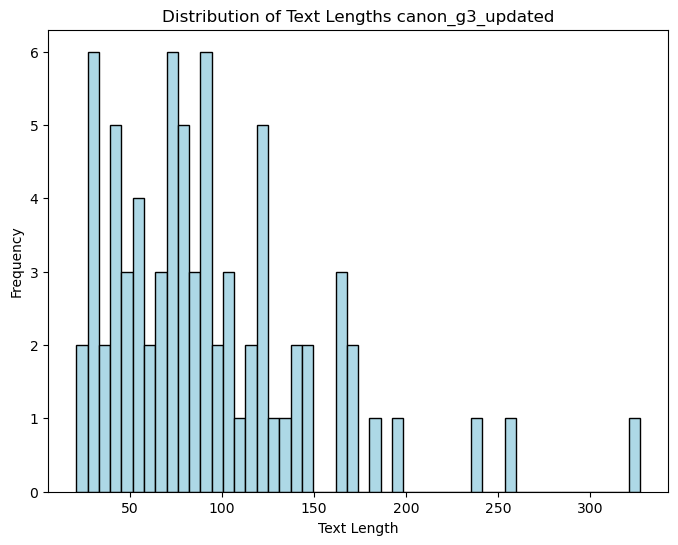

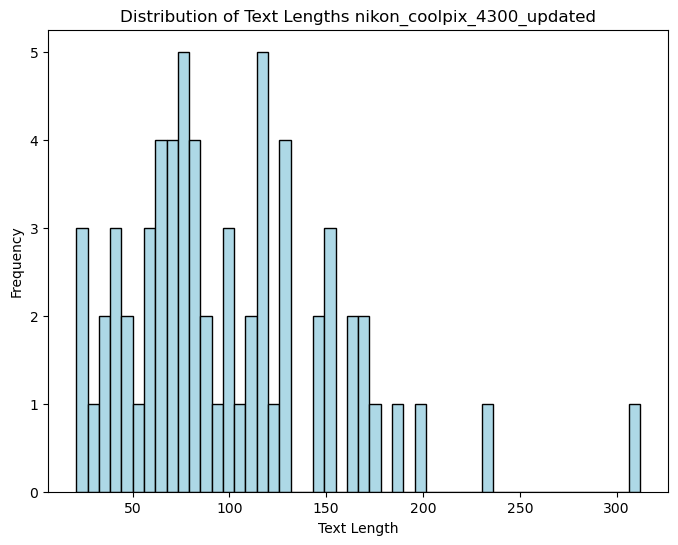

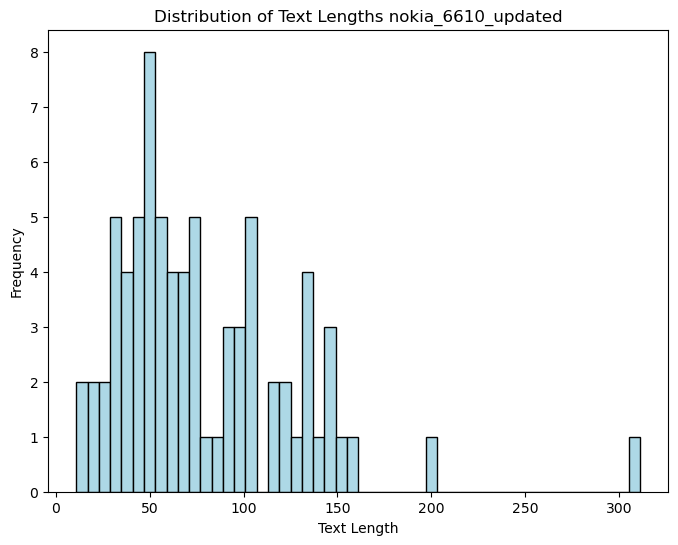

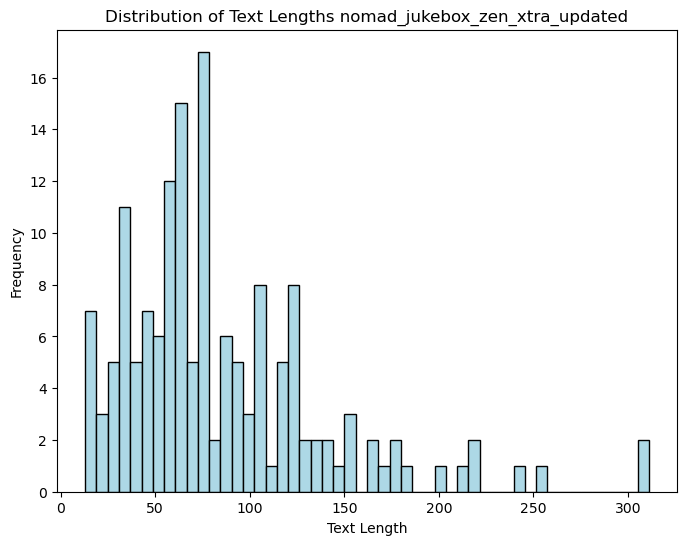

In [69]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']>=3]
    # Add a column for text length
    data['text_length'] = data['sentence'].apply(lambda x: len(str(x)))
    
    # Plot distribution of text lengths
    plt.figure(figsize=(8, 6))
    plt.hist(data['text_length'], bins=50, color='lightblue', edgecolor='black')
    plt.title(f'Distribution of Text Lengths {product}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.show()


##### Negative Word Distribution

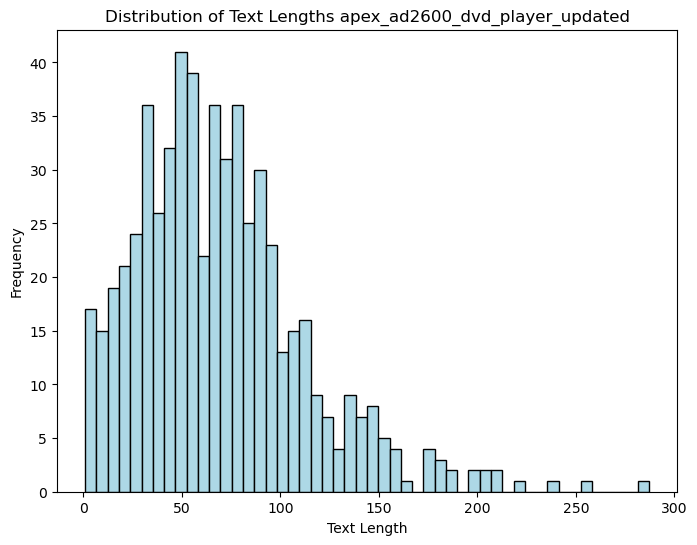

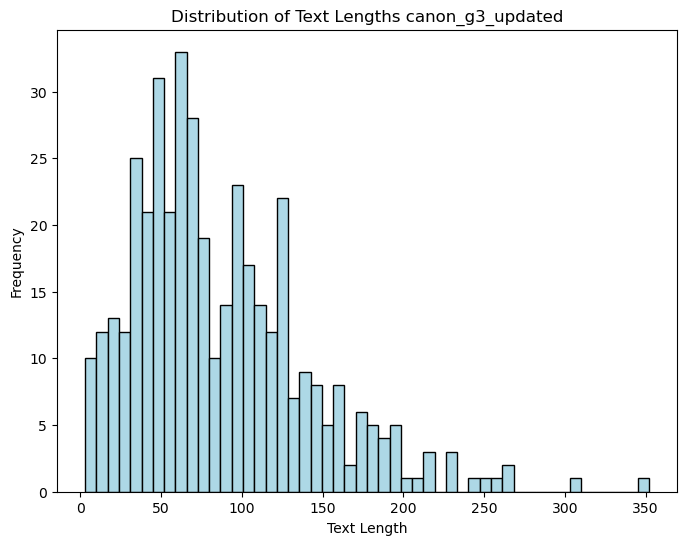

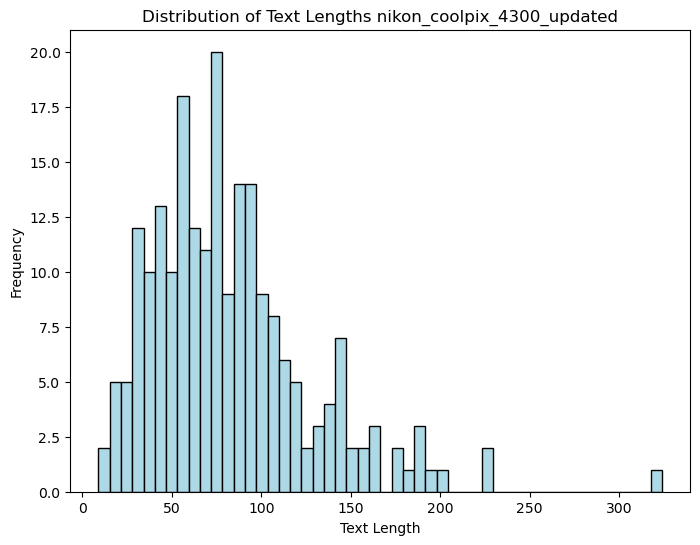

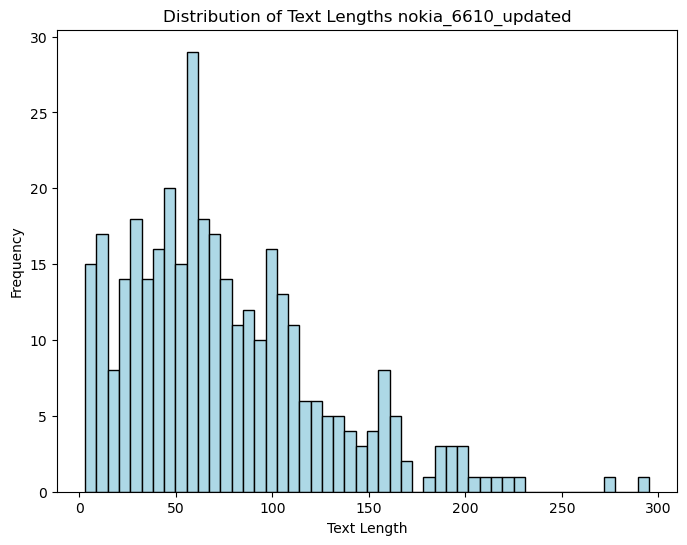

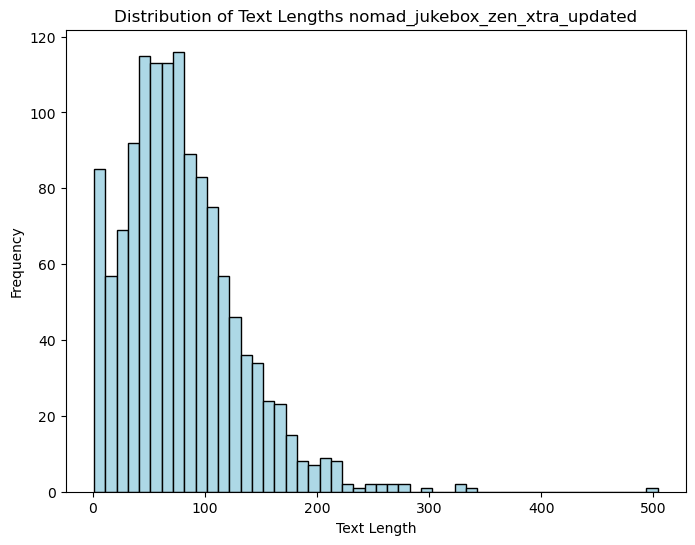

In [72]:
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']<=0]
    # Add a column for text length
    data['text_length'] = data['sentence'].apply(lambda x: len(str(x)))
    
    # Plot distribution of text lengths
    plt.figure(figsize=(8, 6))
    plt.hist(data['text_length'], bins=50, color='lightblue', edgecolor='black')
    plt.title(f'Distribution of Text Lengths {product}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.show()


### Parts of Speech (Need to understand what to do with this analysis)

In [54]:
import pandas as pd
import spacy
from textblob import TextBlob

# Load spaCy's pre-trained English model
nlp = spacy.load("en_core_web_sm")

product= 'apex_ad2600_dvd_player_updated'
file_path = f'..\processed_data\{product}.csv'
data = pd.read_csv(file_path)#['sentence']

# Function to perform POS tagging and sentiment analysis
def analyze_sentiment_and_pos(sentence):
    # POS Tagging with spaCy
    doc = nlp(sentence)
    pos_tags = [(token.text, token.pos_, token.dep_) for token in doc]
    
    # Sentiment Analysis with TextBlob
    blob = TextBlob(sentence)
    sentiment = blob.sentiment.polarity
    if sentiment > 0:
        sentiment_label = "Positive"
    elif sentiment < 0:
        sentiment_label = "Negative"
    else:
        sentiment_label = "Neutral"
    
    return pos_tags, sentiment, sentiment_label

# Apply the function to each row in the DataFrame
data[['pos_tags', 'sentiment_polarity', 'sentiment_label']] = data['sentence'].apply(
    lambda x: pd.Series(analyze_sentiment_and_pos(x))
)

# Display the result
print(data)


      Unnamed: 0                                 title  \
0              0    a quick update to the new zen nx ?   
1              1    a quick update to the new zen nx ?   
2              2    a quick update to the new zen nx ?   
3              3    a quick update to the new zen nx ?   
4              4    a quick update to the new zen nx ?   
...          ...                                   ...   
1711        1711  nomad be wonderful but be carefull !   
1712        1712  nomad be wonderful but be carefull !   
1713        1713  nomad be wonderful but be carefull !   
1714        1714  nomad be wonderful but be carefull !   
1715        1715  nomad be wonderful but be carefull !   

                                               sentence  \
0     this be an edited review now that i have have ...   
1     while there be flaw with the machine the xtra ...   
2            it be the most bang-for-the-buck out there   
3     like it s predecessor the quickly revise nx th...   
4     th

### Word graph

##### Highly negative <-5 word graph

In [ ]:
# Tokenize text and create co-occurrence pairs
def get_cooccurrence_pairs(sentence):
    words = sentence.split()
    return list(combinations(words, 2))

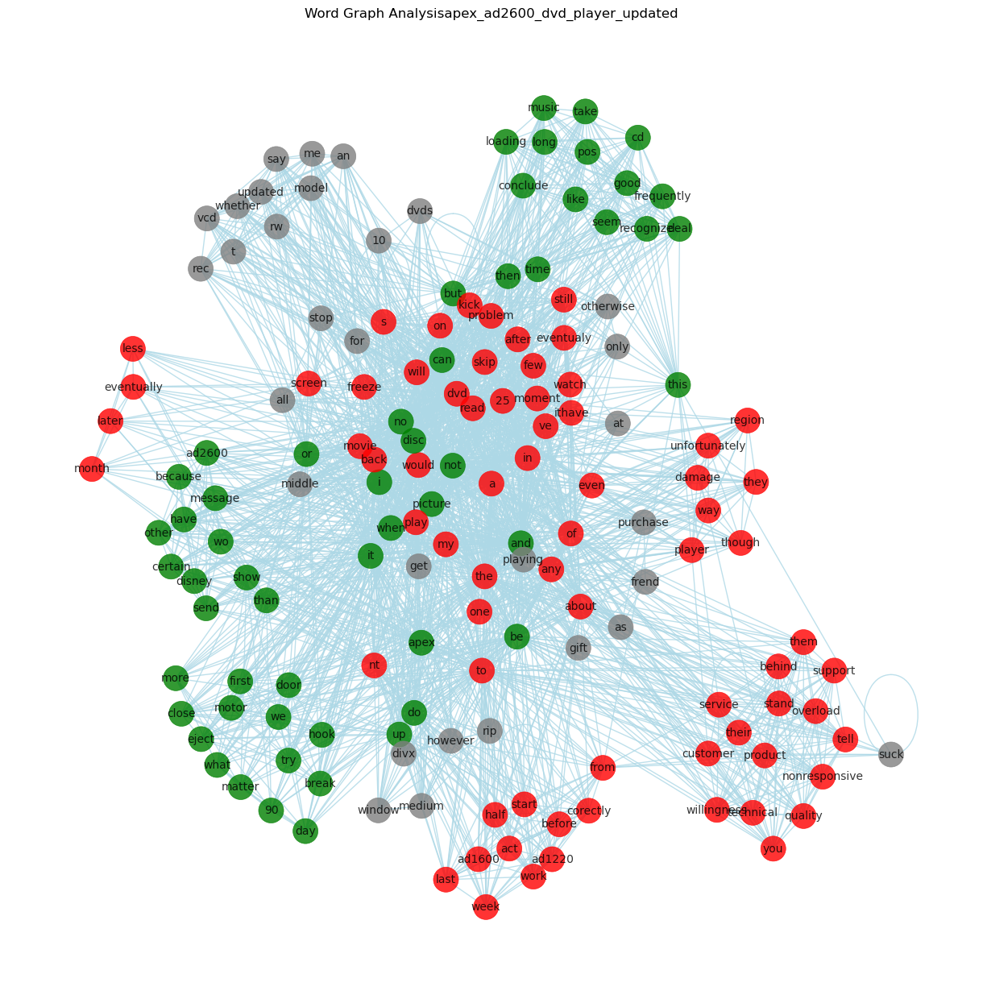

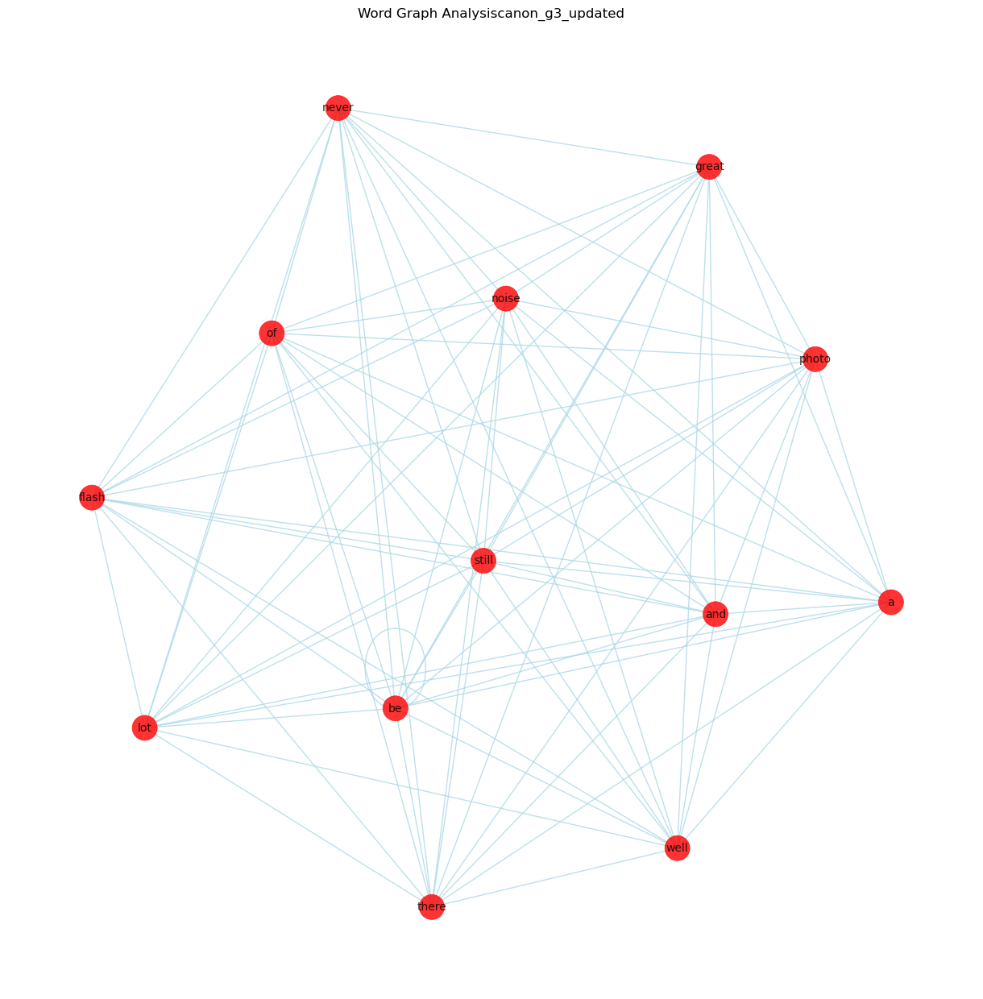

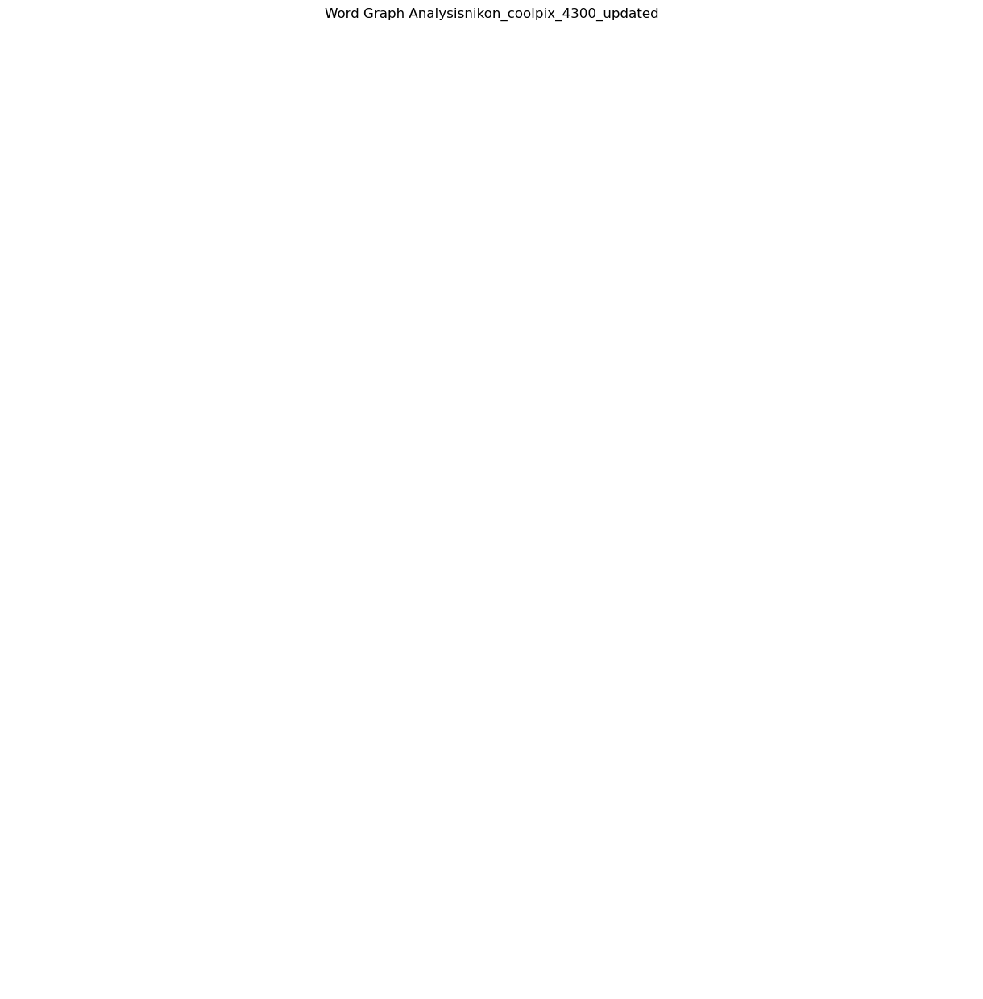

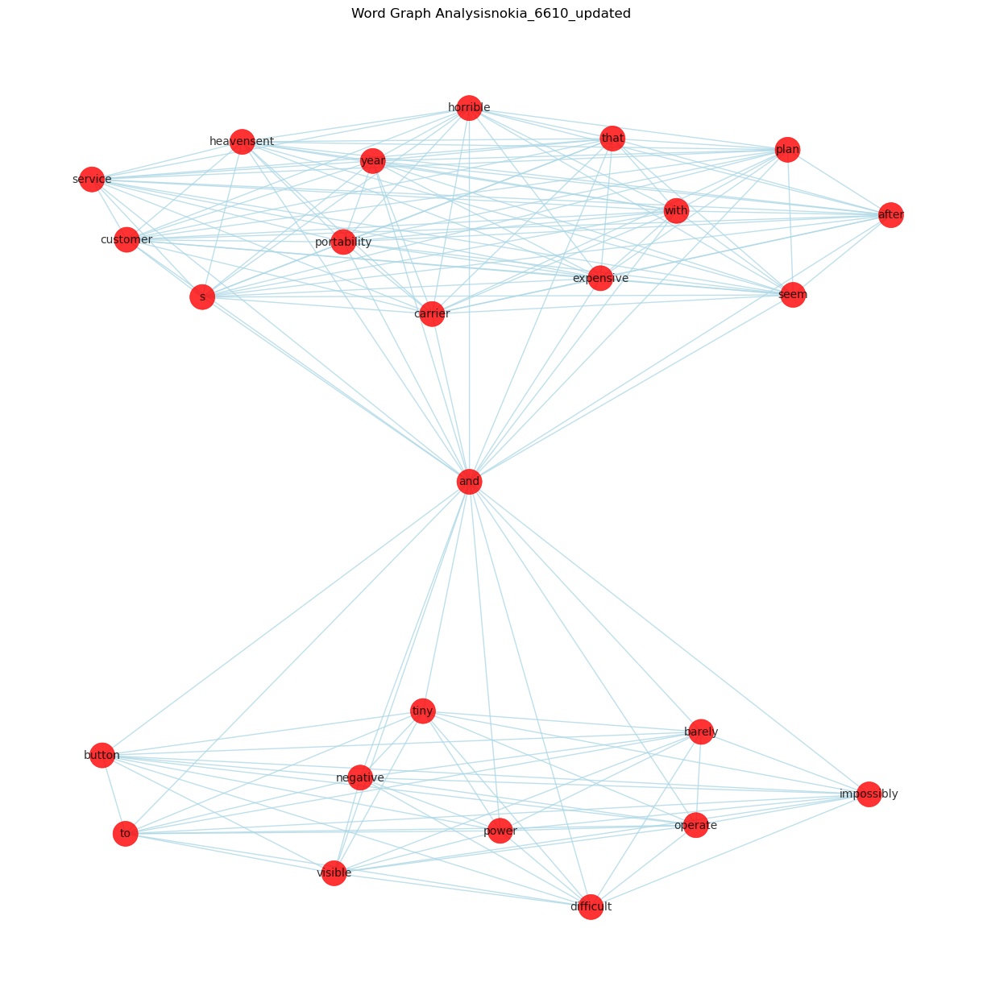

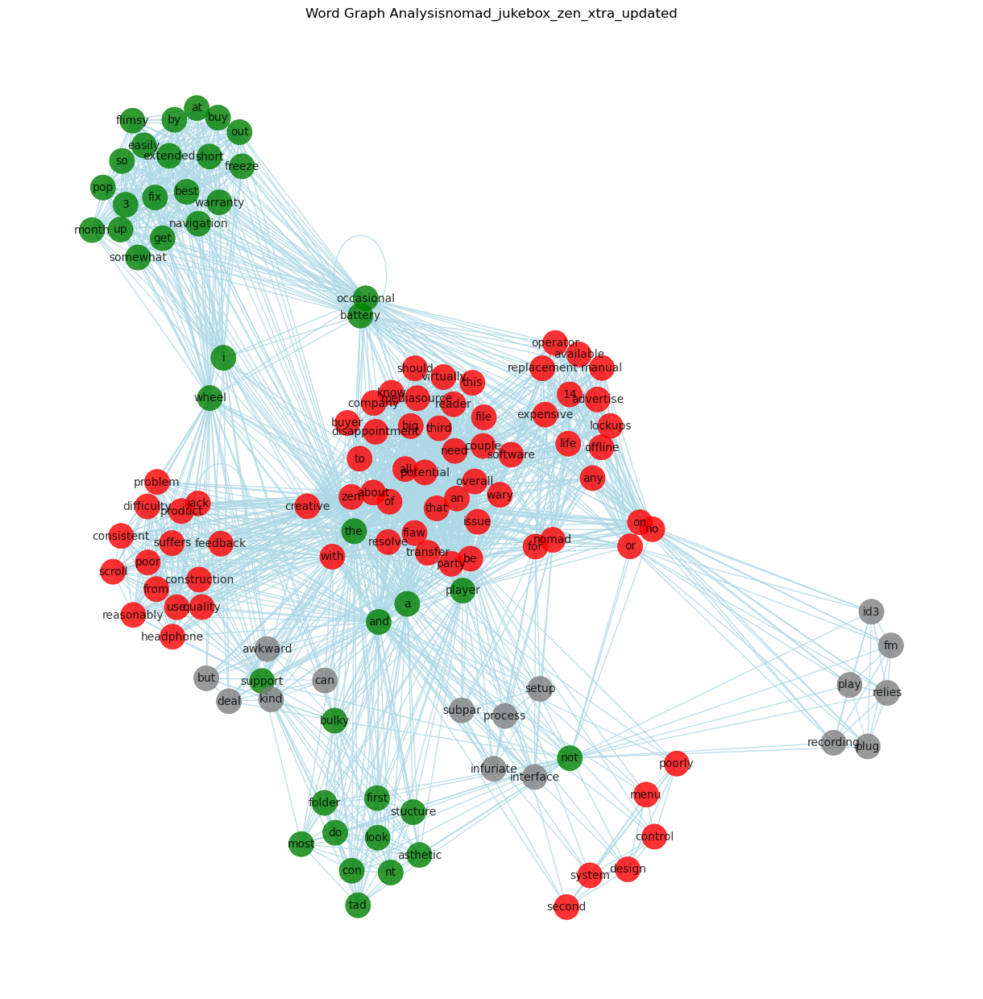

In [82]:

# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']<=-5]
    # Preprocess the data
    data['cleaned_sentence'] = data['sentence'].apply(preprocess_text)
    # Analyze sentiment
    data['sentiment'] = data['sentence'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
    # Get Pairs
    data['pairs'] = data['cleaned_sentence'].apply(get_cooccurrence_pairs)
    # Flatten the list of pairs
    all_pairs = [pair for pairs in data['pairs'] for pair in pairs]
    # Count the pairs
    pair_counts = Counter(all_pairs)
    # Create a graph
    G = nx.Graph()
    # Add edges to the graph with weights
    for pair, weight in pair_counts.items():
        G.add_edge(pair[0], pair[1], weight=weight)
    # Node coloring based on sentiment
    node_colors = []
    for node in G.nodes():
        sentiments = data[data['cleaned_sentence'].str.contains(rf'\b{node}\b', regex=True)]['sentiment']
        avg_sentiment = sentiments.mean() if not sentiments.empty else 0
        if avg_sentiment > 0:
            node_colors.append('green')  # Positive sentiment
        elif avg_sentiment < 0:
            node_colors.append('red')    # Negative sentiment
        else:
            node_colors.append('gray')   # Neutral sentiment
    # Draw the graph
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, k=0.15, iterations=20)  # Layout for visualization
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_size=500,
        font_size=10,
        node_color=node_colors,
        edge_color='lightblue',
        linewidths=0.5,
        alpha=0.8
    )
    plt.title(f'Word Graph Analysis{product}')
    plt.show()


##### Highly Positive

In [ ]:

# Load the dataset
prod_Lis= ['apex_ad2600_dvd_player_updated', 'canon_g3_updated', 'nikon_coolpix_4300_updated', 'nokia_6610_updated', 'nomad_jukebox_zen_xtra_updated']
for product in prod_Lis:
    file_path = f'..\processed_data\{product}.csv'  # Replace with the actual file path
    data = pd.read_csv(file_path)
    data= data[data['sentiment_total']>=5]
    # Preprocess the data
    data['cleaned_sentence'] = data['sentence'].apply(preprocess_text)
    # Analyze sentiment
    data['sentiment'] = data['sentence'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)
    # Get Pairs
    data['pairs'] = data['cleaned_sentence'].apply(get_cooccurrence_pairs)
    # Flatten the list of pairs
    all_pairs = [pair for pairs in data['pairs'] for pair in pairs]
    # Count the pairs
    pair_counts = Counter(all_pairs)
    # Create a graph
    G = nx.Graph()
    # Add edges to the graph with weights
    for pair, weight in pair_counts.items():
        G.add_edge(pair[0], pair[1], weight=weight)
    # Node coloring based on sentiment
    node_colors = []
    for node in G.nodes():
        sentiments = data[data['cleaned_sentence'].str.contains(rf'\b{node}\b', regex=True)]['sentiment']
        avg_sentiment = sentiments.mean() if not sentiments.empty else 0
        if avg_sentiment > 0:
            node_colors.append('green')  # Positive sentiment
        elif avg_sentiment < 0:
            node_colors.append('red')    # Negative sentiment
        else:
            node_colors.append('gray')   # Neutral sentiment
    # Draw the graph
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, k=0.15, iterations=20)  # Layout for visualization
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_size=500,
        font_size=10,
        node_color=node_colors,
        edge_color='lightblue',
        linewidths=0.5,
        alpha=0.8
    )
    plt.title(f'Word Graph Analysis{product}')
    plt.show()
